In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import re
import nltk
from nltk.corpus import stopwords
import string
import json
from time import time
import pickle
from tensorflow.keras.applications import VGG16, ResNet50
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import Input, Dense, Dropout, Embedding, LSTM, add

# Data Preprocessing - Captions
# word_to_idx is mapping between each unique word in all_vocab to int value
# idx_to_word is vice-versa



In [2]:

# Read Captions File
# Reading the Description file
with open("C:/Users/PRANEETH/Downloads/Flickr8k_text/Flickr8k.token.txt") as filepath:
    captions = filepath.read()
    filepath.close()
captions = captions.split("\n")[:-1]
print(len(captions))  # Check the number of captions, should be 40460

# Creating a "descriptions" dictionary where the key is 'img_name' and the value is a list of captions corresponding to that image_file.
descriptions = {}

for ele in captions:
    i_to_c = ele.split("\t")
    img_name = i_to_c[0].split(".")[0]
    cap = i_to_c[1]

    if descriptions.get(img_name) is None:
        descriptions[img_name] = []

    descriptions[img_name].append(cap)

# Data Cleaning
def clean_text(sample):
    sample = sample.lower()
    sample = re.sub("[^a-z]+", " ", sample)
    sample = sample.split()
    sample = [s for s in sample if len(s) > 1]
    sample = " ".join(sample)
    return sample

# Modify all the captions, i.e., cleaned captions
for key, desc_list in descriptions.items():
    for i in range(len(desc_list)):
        desc_list[i] = clean_text(desc_list[i])

# Writing clean descriptions to a .txt file
with open("descriptions.txt", "w") as f:
    f.write(str(descriptions))

# Reading description file
with open("descriptions.txt", 'r') as f:
    descriptions = f.read()

json_acceptable_string = descriptions.replace("'", "\"")
descriptions = json.loads(json_acceptable_string)

# Finding the unique vocabulary
vocabulary = set()

for key in descriptions.keys():
    [vocabulary.update(i.split()) for i in descriptions[key]]

print('Vocabulary Size:', len(vocabulary))

# All words in the description dictionary
all_vocab = []

for key in descriptions.keys():
    [all_vocab.append(i) for des in descriptions[key] for i in des.split()]

print('Vocabulary Size:', len(all_vocab))
print(all_vocab[:15])

# Count the frequency of each word, sort them, and discard the words having a frequency less than the threshold value
import collections

counter = collections.Counter(all_vocab)
dic_ = dict(counter)
threshold_value = 10

sorted_dic = sorted(dic_.items(), reverse=True, key=lambda x: x[1])
sorted_dic = [x for x in sorted_dic if x[1] > threshold_value]
all_vocab = [x[0] for x in sorted_dic]
print(len(all_vocab))

# Loading Training Testing Data
# TrainImagesFile
with open("C:/Users/PRANEETH/Downloads/Flickr8k_text/Flickr_8k.trainImages.txt") as f:
    train = f.read().split("\n")[:-1]

train = [e.split(".")[0] for e in train]

# TestImagesFile
with open("C:/Users/PRANEETH/Downloads/Flickr8k_text/Flickr_8k.testImages.txt") as f:
    test = f.read().split("\n")[:-1]

test = [e.split(".")[0] for e in test]

# Create train_descriptions dictionary, which will be similar to the earlier one but having only train samples
# Add startseq + endseq
train_descriptions = {}

for t in train:
    train_descriptions[t] = []
    for cap in descriptions[t]:
        cap_to_append = "startseq " + cap + " endseq"
        train_descriptions[t].append(cap_to_append)

# Data Preprocessing - Images
# In this section, we will load our images and do some processing so that we can feed it into our network.
model = ResNet50(weights="imagenet", input_shape=(224, 224, 3))

# Create a new model, by removing the last layer (output layer of 1000 classes) from the ResNet50
model_new = Model(model.input, model.layers[-2].output)
images = "C:/Users/PRANEETH/Downloads/Flickr8k_Dataset/Flicker8k_Dataset/"

def preprocess_image(img):
    img = image.load_img(img, target_size=(224, 224))
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = tf.keras.applications.resnet50.preprocess_input(img)
    return img

def encode_image(img):
    img = preprocess_image(img)
    feature_vector = model_new.predict(img)
    feature_vector = feature_vector.reshape(feature_vector.shape[1],)
    return feature_vector

start = time()
encoding_train = {}

for ix, img in enumerate(train):
    img = "C:/Users/PRANEETH/Downloads/Flickr8k_Dataset/Flicker8k_Dataset/{}.jpg".format(train[ix])
    encoding_train[img[len(images):]] = encode_image(img)
    if ix % 100 == 0:
        print("Encoding image-", ix)

print("Time taken in seconds =", time() - start)

# Save the bottleneck train features to disk
with open("encoded_train_images.pkl", "wb") as encoded_pickle:
    pickle.dump(encoding_train, encoded_pickle)

start = time()
encoding_test = {}

for ix, img in enumerate(test):
    img = "C:/Users/PRANEETH/Downloads/Flickr8k_Dataset/Flicker8k_Dataset/{}.jpg".format(test[ix])
    encoding_test[img[len(images):]] = encode_image(img)
    if ix % 100 == 0:
        print("Encoding image-", ix)

print("Time taken in seconds =", time() - start)

# Save the bottleneck test features to disk
with open("encoded_test_images.pkl", "wb") as encoded_pickle:
    pickle.dump(encoding_test, encoded_pickle)

# Load the train images features from disk
with open("encoded_train_images.pkl", "rb") as encoded_pickle:
    encoding_train = pickle.load(encoded_pickle)

# Load the test images features from disk
with open("encoded_test_images.pkl", "rb") as encoded_pickle:
    encoding_test = pickle.load(encoded_pickle)


40460
Vocabulary Size: 8424
Vocabulary Size: 373837
['child', 'in', 'pink', 'dress', 'is', 'climbing', 'up', 'set', 'of', 'stairs', 'in', 'an', 'entry', 'way', 'girl']
1845
1/1 [==============================] - 3s 3s/step
Encoding image- 0
1/1 [==============================] - 0s 185ms/step
Encoding image- 100
1/1 [==============================] - 0s 189ms/step


1/1 [==============================] - 0s 195ms/step
Encoding image- 200
1/1 [==============================] - 0s 253ms/step
Encoding image- 300
1/1 [==============================] - 0s 191ms/step


1/1 [==============================] - 0s 189ms/step
Encoding image- 400
1/1 [==============================] - 0s 216ms/step


1/1 [==============================] - 0s 182ms/step
Encoding image- 500
1/1 [==============================] - 0s 193ms/step
Encoding image- 600
1/1 [==============================] - 0s 236ms/step


1/1 [==============================] - 0s 158ms/step
Encoding image- 700
1/1 [==============================] - 0s 182ms/step


1/1 [==============================] - 0s 182ms/step
Encoding image- 800
1/1 [==============================] - 0s 172ms/step
Encoding image- 900
1/1 [==============================] - 0s 172ms/step


1/1 [==============================] - 0s 172ms/step
Encoding image- 1000
1/1 [==============================] - 0s 253ms/step


1/1 [==============================] - 0s 178ms/step
Encoding image- 1100
1/1 [==============================] - 0s 167ms/step
Encoding image- 1200
1/1 [==============================] - 0s 171ms/step


1/1 [==============================] - 0s 184ms/step
Encoding image- 1300
1/1 [==============================] - 0s 177ms/step


1/1 [==============================] - 0s 176ms/step
Encoding image- 1400
1/1 [==============================] - 0s 225ms/step
Encoding image- 1500
1/1 [==============================] - 0s 179ms/step


1/1 [==============================] - 0s 188ms/step
Encoding image- 1600
1/1 [==============================] - 0s 188ms/step


1/1 [==============================] - 0s 153ms/step
Encoding image- 1700
1/1 [==============================] - 0s 176ms/step
Encoding image- 1800
1/1 [==============================] - 0s 186ms/step


1/1 [==============================] - 0s 173ms/step
Encoding image- 1900
1/1 [==============================] - 0s 162ms/step


1/1 [==============================] - 0s 172ms/step
Encoding image- 2000
1/1 [==============================] - 0s 176ms/step
Encoding image- 2100
1/1 [==============================] - 0s 198ms/step


1/1 [==============================] - 0s 293ms/step
Encoding image- 2200
1/1 [==============================] - 0s 173ms/step


1/1 [==============================] - 0s 188ms/step
Encoding image- 2300
1/1 [==============================] - 0s 204ms/step
Encoding image- 2400
1/1 [==============================] - 0s 251ms/step


1/1 [==============================] - 0s 203ms/step
Encoding image- 2500
1/1 [==============================] - 0s 251ms/step
Encoding image- 2600
1/1 [==============================] - 0s 203ms/step


1/1 [==============================] - 0s 203ms/step
Encoding image- 2700
1/1 [==============================] - 0s 216ms/step


1/1 [==============================] - 0s 204ms/step
Encoding image- 2800
1/1 [==============================] - 0s 204ms/step
Encoding image- 2900
1/1 [==============================] - 0s 213ms/step


1/1 [==============================] - 0s 220ms/step
Encoding image- 3000
1/1 [==============================] - 0s 219ms/step


1/1 [==============================] - 0s 220ms/step
Encoding image- 3100
1/1 [==============================] - 0s 224ms/step
Encoding image- 3200
1/1 [==============================] - 0s 227ms/step


1/1 [==============================] - 0s 221ms/step
Encoding image- 3300
1/1 [==============================] - 0s 215ms/step


1/1 [==============================] - 0s 267ms/step
Encoding image- 3400
1/1 [==============================] - 0s 227ms/step
Encoding image- 3500
1/1 [==============================] - 0s 225ms/step


1/1 [==============================] - 0s 239ms/step
Encoding image- 3600
1/1 [==============================] - 0s 235ms/step


1/1 [==============================] - 0s 244ms/step
Encoding image- 3700
1/1 [==============================] - 0s 431ms/step
Encoding image- 3800
1/1 [==============================] - 0s 141ms/step


1/1 [==============================] - 0s 157ms/step
Encoding image- 3900
1/1 [==============================] - 0s 161ms/step


1/1 [==============================] - 0s 162ms/step
Encoding image- 4000
1/1 [==============================] - 0s 165ms/step
Encoding image- 4100
1/1 [==============================] - 0s 155ms/step


1/1 [==============================] - 0s 339ms/step
Encoding image- 4200
1/1 [==============================] - 0s 385ms/step


1/1 [==============================] - 0s 400ms/step
Encoding image- 4300
1/1 [==============================] - 0s 300ms/step
Encoding image- 4400
1/1 [==============================] - 1s 727ms/step


1/1 [==============================] - 1s 568ms/step
Encoding image- 4500
1/1 [==============================] - 0s 435ms/step
Encoding image- 4600


1/1 [==============================] - 0s 445ms/step
Encoding image- 4700
1/1 [==============================] - 0s 459ms/step


1/1 [==============================] - 0s 272ms/step
Encoding image- 4800
1/1 [==============================] - 0s 372ms/step
Encoding image- 4900
1/1 [==============================] - 0s 407ms/step


1/1 [==============================] - 0s 284ms/step
Encoding image- 5000
1/1 [==============================] - 0s 416ms/step


1/1 [==============================] - 0s 445ms/step
Encoding image- 5100
1/1 [==============================] - 0s 391ms/step
Encoding image- 5200
1/1 [==============================] - 0s 303ms/step


1/1 [==============================] - 0s 299ms/step
Encoding image- 5300
1/1 [==============================] - 0s 312ms/step


1/1 [==============================] - 0s 308ms/step
Encoding image- 5400
1/1 [==============================] - 0s 313ms/step
Encoding image- 5500
1/1 [==============================] - 0s 408ms/step


1/1 [==============================] - 0s 324ms/step
Encoding image- 5600
1/1 [==============================] - 0s 358ms/step


1/1 [==============================] - 0s 454ms/step
Encoding image- 5700
1/1 [==============================] - 0s 434ms/step
Encoding image- 5800
1/1 [==============================] - 0s 434ms/step


1/1 [==============================] - 0s 433ms/step
Encoding image- 5900
1/1 [==============================] - 0s 458ms/step


1/1 [==============================] - 0s 457ms/step
Time taken in seconds = 3304.25678563118
1/1 [==============================] - 1s 536ms/step
Encoding image- 0
1/1 [==============================] - 0s 327ms/step
Encoding image- 100
1/1 [==============================] - 0s 452ms/step


1/1 [==============================] - 0s 477ms/step
Encoding image- 200
1/1 [==============================] - 0s 474ms/step


1/1 [==============================] - 0s 492ms/step
Encoding image- 300
1/1 [==============================] - 0s 490ms/step
Encoding image- 400
1/1 [==============================] - 1s 533ms/step


1/1 [==============================] - 0s 492ms/step
Encoding image- 500
1/1 [==============================] - 0s 398ms/step


1/1 [==============================] - 0s 483ms/step
Encoding image- 600
1/1 [==============================] - 0s 495ms/step
Encoding image- 700
1/1 [==============================] - 1s 507ms/step


1/1 [==============================] - 0s 446ms/step
Encoding image- 800
1/1 [==============================] - 0s 499ms/step
Encoding image- 900
1/1 [==============================] - 1s 504ms/step


1/1 [==============================] - 1s 522ms/step
Time taken in seconds = 654.0995843410492


In [3]:
ix = 1
word_to_idx = {}
idx_to_word = {}

for e in all_vocab:
    word_to_idx[e] = ix
    idx_to_word[ix] = e
    ix += 1

# Need to add these 2 words as well
word_to_idx['startseq'] = 1846
word_to_idx['endseq'] = 1847
idx_to_word
for e in all_vocab:
    word_to_idx[e] = ix
    idx_to_word[ix] = e
    ix += 1

# Need to add these 2 words as well
word_to_idx['startseq'] = 1846
word_to_idx['endseq'] = 1847
idx_to_word[1846] = 'startseq'
idx_to_word[1847] = 'endseq'

# Vocab_size is total vocabulary len + 1 because we will append 0's as well.
vocab_size = len(idx_to_word) + 1
print(vocab_size)

all_captions_len = []

for key in train_descriptions.keys():
    for cap in train_descriptions[key]:
        all_captions_len.append(len(cap.split()))

max_len = max(all_captions_len)
print(max_len)

# Data Preparation using Generator Function
def data_generator(train_descriptions, encoding_train, word_to_idx, max_len, num_photos_per_batch):
    X1, X2, y = [], [], []
    n = 0

    while True:
        for key, desc_list in train_descriptions.items():
            n += 1
            photo = encoding_train[key + ".jpg"]
            for desc in desc_list:
                seq = [word_to_idx[word] for word in desc.split() if word in word_to_idx]
                for i in range(1, len(seq)):
                    in_seq = seq[0:i]
                    out_seq = seq[i]
                    in_seq = pad_sequences([in_seq], maxlen=max_len, value=0, padding='post')[0]
                    out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]
                    X1.append(photo)
                    X2.append(in_seq)
                    y.append(out_seq)
            if n == num_photos_per_batch:
                yield ([np.array(X1), np.array(X2)], np.array(y))
                X1, X2, y = [], [], []
                n = 0

# Word Embedding
with open("C:/Users/PRANEETH/Downloads/glove.6B.50d.txt", encoding='utf8') as f:
    embedding_index = {}
    for line in f:
        values = line.split()
        word = values[0]
        coefs = np.asarray(values[1:], dtype="float")
        embedding_index[word] = coefs

# Converting words into vectors Directly - (Embedding Layer Output)
def get_embedding_output():
    emb_dim = 50
    embedding_output = np.zeros((vocab_size, emb_dim))
    for word, idx in word_to_idx.items():
        embedding_vector = embedding_index.get(word)
        if embedding_vector is not None:
            embedding_output[idx] = embedding_vector
    return embedding_output

embedding_output = get_embedding_output()
print(embedding_output.shape)

# Model Architecture
# Image feature extractor model
input_img_fea = Input(shape=(2048,))
inp_img1 = Dropout(0.3)(input_img_fea)
inp_img2 = Dense(256, activation='relu')(inp_img1)

# Partial caption sequence model
input_cap = Input(shape=(max_len,))
inp_cap1 = Embedding(input_dim=vocab_size, output_dim=50, mask_zero=True)(input_cap)
inp_cap2 = Dropout(0.3)(inp_cap1)
inp_cap3 = LSTM(256)(inp_cap2)
decoder1 = add([inp_img2, inp_cap3])
decoder2 = Dense(256, activation='relu')(decoder1)
outputs = Dense(vocab_size, activation='softmax')(decoder2)

# Merge 2 networks
model = Model(inputs=[input_img_fea, input_cap], outputs=outputs)
model.summary()

model.layers[2].set_weights([embedding_output])
model.layers[2].trainable = False
model.compile(loss="categorical_crossentropy", optimizer="adam")

# Train Our Model
epochs = 15
number_pics_per_batch = 3
steps = len(train_descriptions) // number_pics_per_batch

for i in range(epochs):
    generator = data_generator(train_descriptions, encoding_train, word_to_idx, max_len, number_pics_per_batch)
    model.fit(generator, epochs=1, steps_per_epoch=steps, verbose=1)
    model.save('./model_weights/model_' + str(i) + '.h5')

3691
35
(3691, 50)
Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 35)]         0           []                               
                                                                                                  
 input_2 (InputLayer)           [(None, 2048)]       0           []                               
                                                                                                  
 embedding (Embedding)          (None, 35, 50)       184550      ['input_3[0][0]']                
                                                                                                  
 dropout (Dropout)              (None, 2048)         0           ['input_2[0][0]']                
                                                                         

In [8]:
model = load_model("./model_weights/model_9.h5")

In [9]:
def predict_caption(photo):
    in_text = "startseq"
    
    for i in range(max_len):
        sequence = [word_to_idx[w] for w in in_text.split() if w in word_to_idx]
        sequence = pad_sequences([sequence], maxlen=max_len, padding='post')

        ypred =  model.predict([photo,sequence])
        ypred = ypred.argmax()
        word = idx_to_word[ypred]
        in_text+= ' ' +word
        
        if word =='endseq':
            break
        
        
    final_caption =  in_text.split()
    final_caption = final_caption[1:-1]
    final_caption = ' '.join(final_caption)
    
    return final_caption

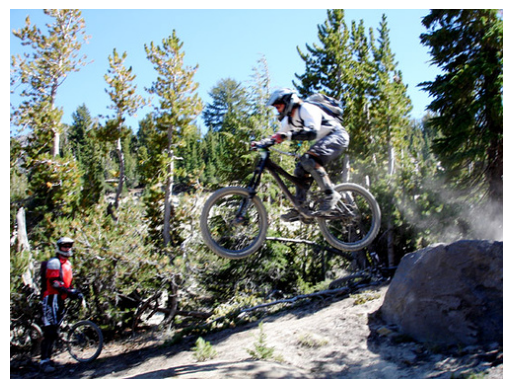

1/1 [==============================] - 0s 17ms/step
man startseq blue shirt and helmet is riding bicycle through


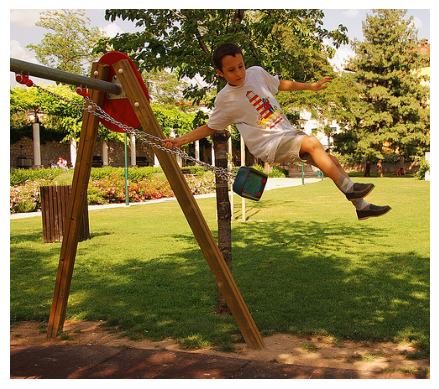

1/1 [==============================] - 0s 5ms/step
boy startseq blue shirt is hanging upside down from swing set to make


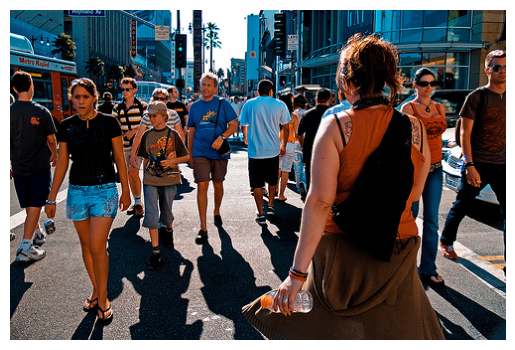

1/1 [==============================] - 0s 20ms/step
group of people are standing startseq front of candles


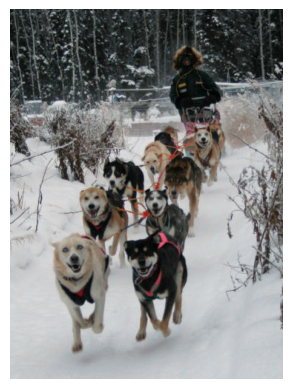

1/1 [==============================] - 0s 16ms/step
two husky dogs are playing frisbee startseq


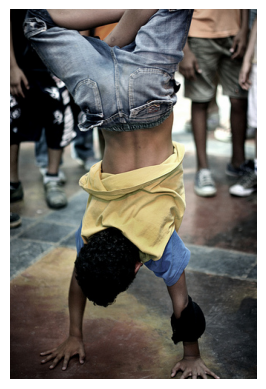

1/1 [==============================] - 0s 31ms/step
little girl startseq red shirt and white shorts is running on


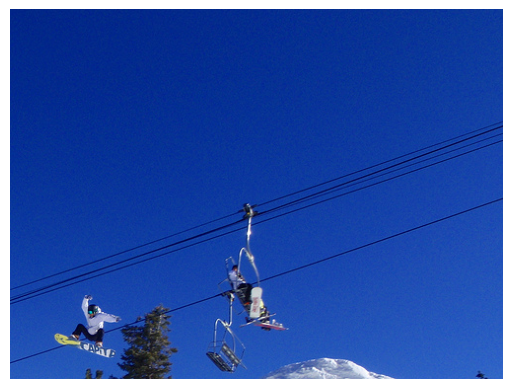

1/1 [==============================] - 0s 15ms/step
person startseq red coat is skiing


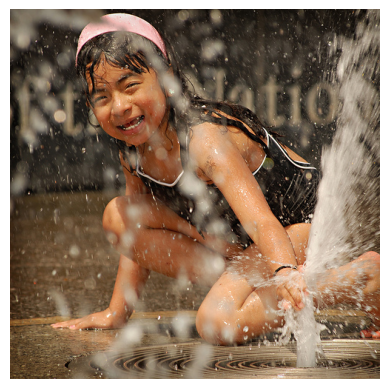

1/1 [==============================] - 0s 15ms/step
young boy startseq swimming pool


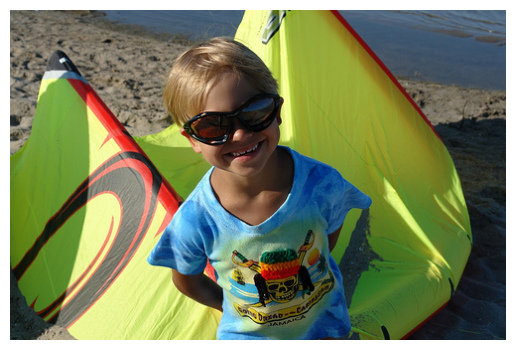

1/1 [==============================] - 0s 16ms/step
little girl startseq pink shirt is playing with fireworks


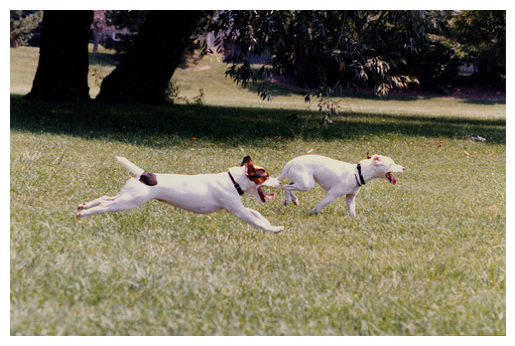

1/1 [==============================] - 0s 31ms/step
two white dogs are playing with toy


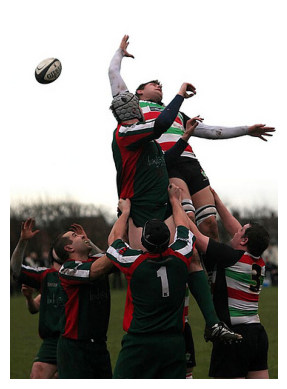

1/1 [==============================] - 0s 31ms/step
two men startseq martial arts game


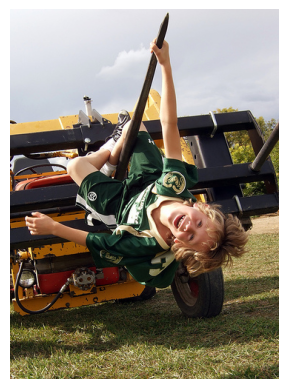

1/1 [==============================] - 0s 16ms/step
boy startseq red shirt is playing on roller


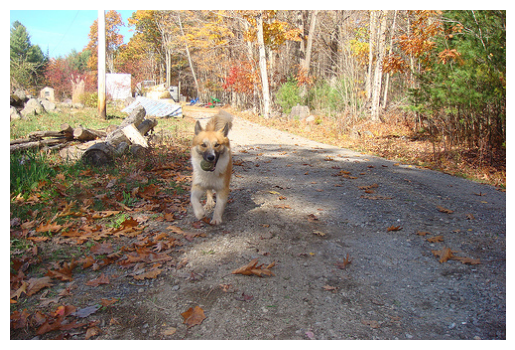

1/1 [==============================] - 0s 31ms/step
white dog running through


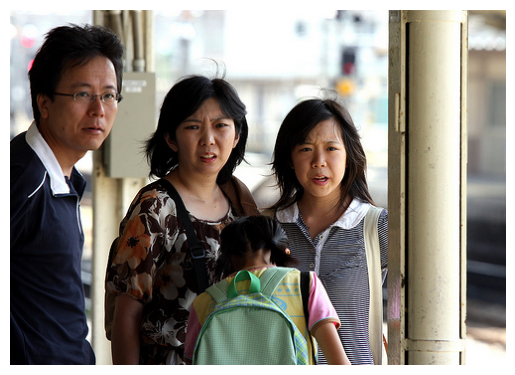

1/1 [==============================] - 0s 16ms/step
man and woman pose for picture


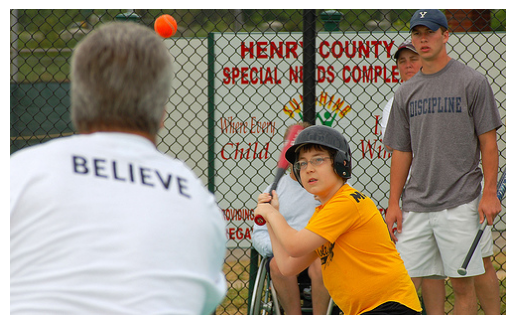

1/1 [==============================] - 0s 26ms/step
boy startseq blue shirt and blue jeans is playing with fireworks


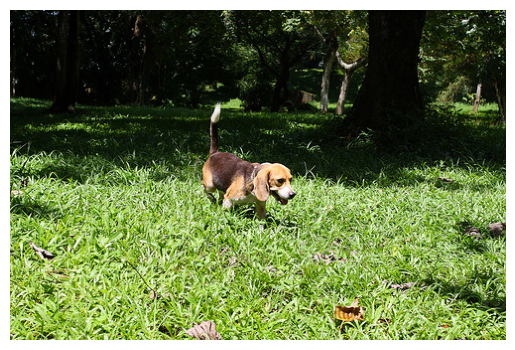

1/1 [==============================] - 0s 31ms/step
two dogs are running through field of grass


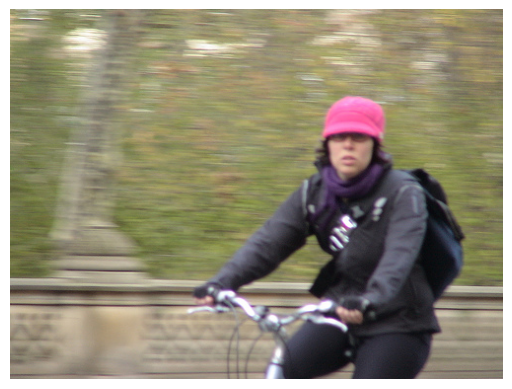

1/1 [==============================] - 0s 31ms/step
boy wearing blue shirt and helmet riding his bike on


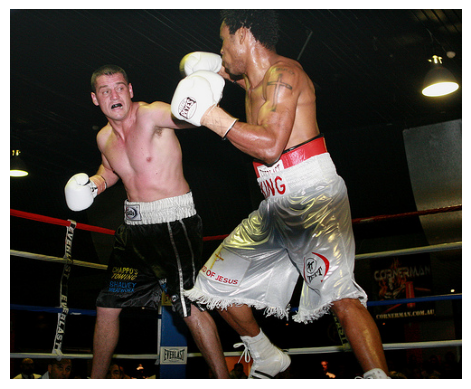

1/1 [==============================] - 0s 31ms/step
two men startseq bathing clothes are playing basketball


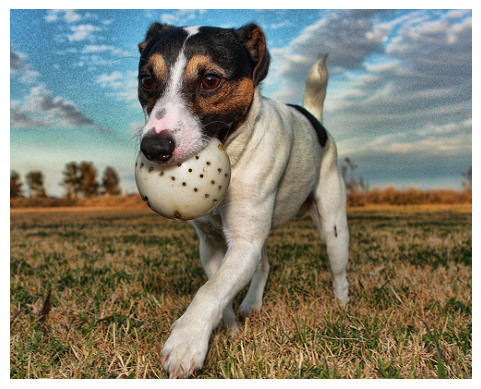

1/1 [==============================] - 0s 31ms/step
white and white dog is running through


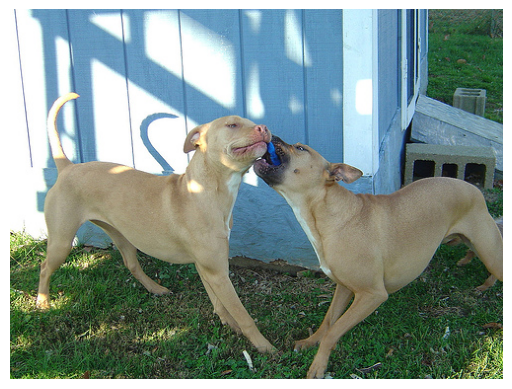

1/1 [==============================] - 0s 31ms/step
two dogs are playing with each other startseq


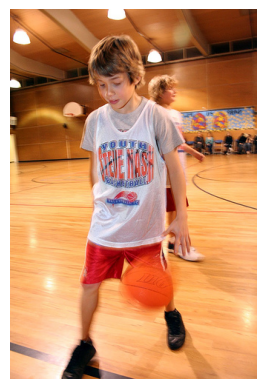

1/1 [==============================] - 0s 16ms/step
boy startseq blue shirt is playing basketball


In [10]:
for i in range(20):
    rn =  np.random.randint(0, 1000)
    img_name = list(encoding_test.keys())[rn]
    photo = encoding_test[img_name].reshape((1,2048))

    i = plt.imread(images+img_name)
    plt.imshow(i)
    plt.axis("off")
    plt.show()

    caption = predict_caption(photo)
    print(caption)

1/1 [==============================] - 0s 203ms/step


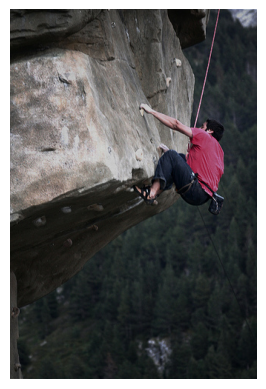

1/1 [==============================] - 0s 31ms/step
Predicted Caption: man startseq red shirt and helmet is climbing rock face


In [21]:
import numpy as np
import matplotlib.pyplot as plt

# Load the custom image
custom_image_path = "C:/Users/PRANEETH/Downloads/Flickr8k_Dataset/Flicker8k_Dataset/997722733_0cb5439472.jpg"
photo = encode_image(custom_image_path).reshape((1, 2048))

# Display the custom image
custom_image = plt.imread(custom_image_path)
plt.imshow(custom_image)
plt.axis("off")
plt.show()

# Predict the caption for the custom image
caption = predict_caption(photo)
print("Predicted Caption:", caption)


In [22]:
new_caption =re.sub(r'\s*startseq\s*', ' ', caption).strip()
new_caption

'man red shirt and helmet is climbing rock face'

In [25]:
model = load_model("./model_weights/model_14.h5")

In [26]:
def predict_caption(photo):
    in_text = "startseq"
    
    for i in range(max_len):
        sequence = [word_to_idx[w] for w in in_text.split() if w in word_to_idx]
        sequence = pad_sequences([sequence], maxlen=max_len, padding='post')

        ypred =  model.predict([photo,sequence])
        ypred = ypred.argmax()
        word = idx_to_word[ypred]
        in_text+= ' ' +word
        
        if word =='endseq':
            break
        
        
    final_caption =  in_text.split()
    final_caption = final_caption[1:-1]
    final_caption = ' '.join(final_caption)
    
    return final_caption

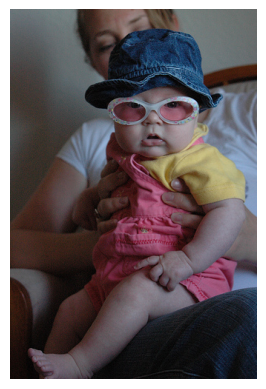

1/1 [==============================] - 0s 33ms/step
little girl with nose and glasses is sitting startseq bed


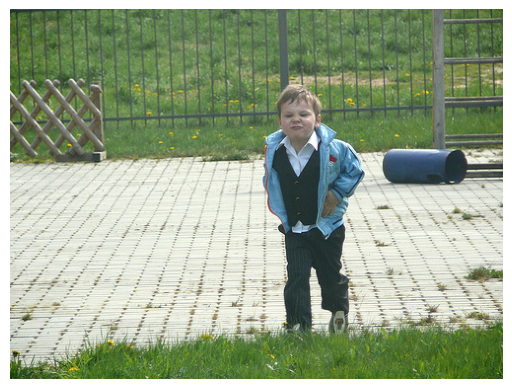

1/1 [==============================] - 0s 47ms/step
boy startseq red shirt and jeans is standing startseq front of some bushes


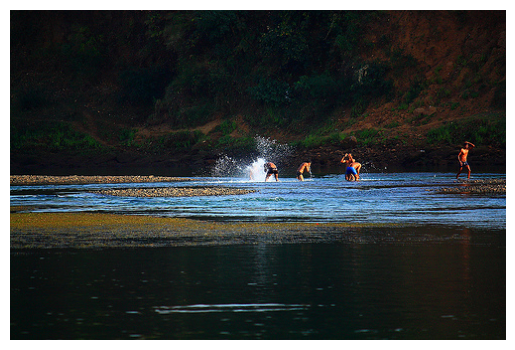

1/1 [==============================] - 0s 16ms/step
two people are sitting startseq


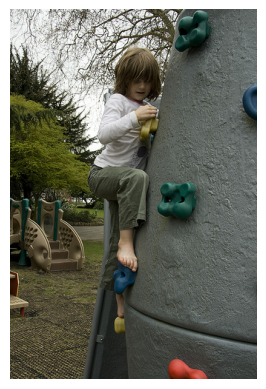

1/1 [==============================] - 0s 31ms/step
little boy startseq crawling is sitting on


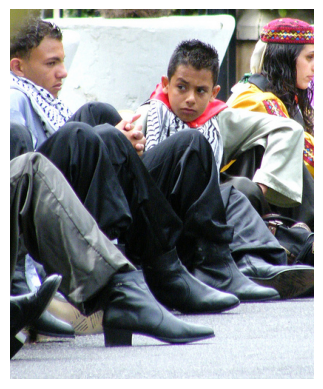

1/1 [==============================] - 0s 78ms/step
man and woman sit on bench startseq front of


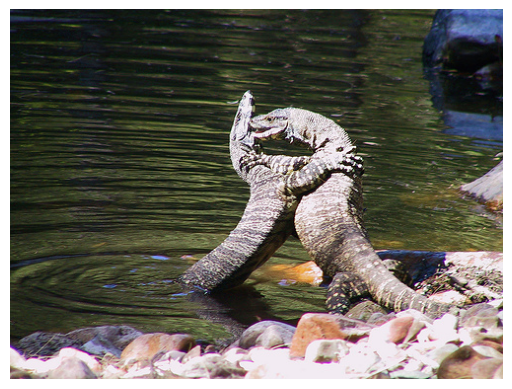

1/1 [==============================] - 0s 34ms/step
dog swims through water


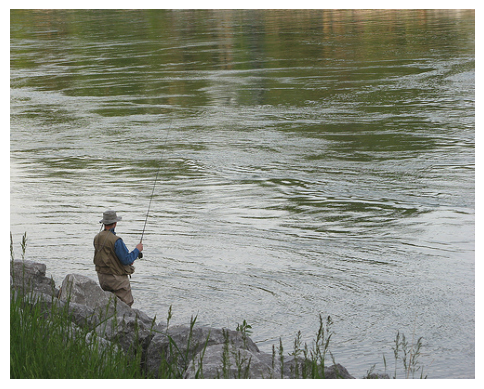

1/1 [==============================] - 0s 23ms/step
man startseq blue shirt is standing startseq front of


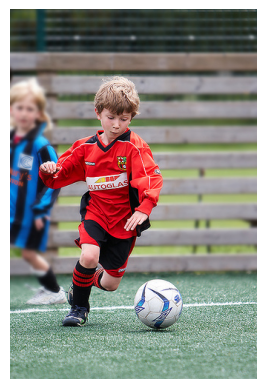

1/1 [==============================] - 0s 262ms/step
boy startseq blue shirt is playing cricket startseq field


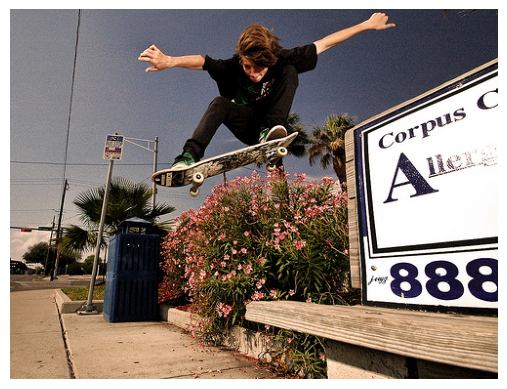

1/1 [==============================] - 0s 16ms/step
skateboarder is jumping over hurdle


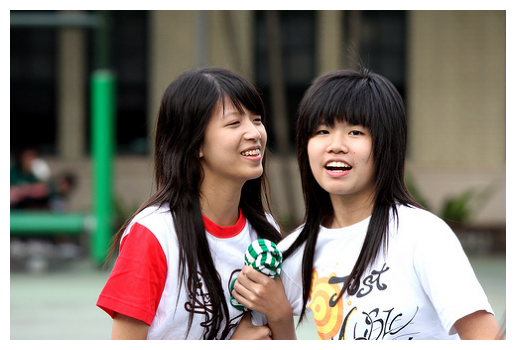

1/1 [==============================] - 0s 16ms/step
man startseq purple shirt and black hat is holding camera


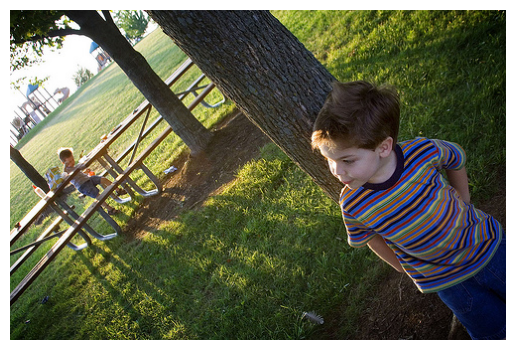

1/1 [==============================] - 0s 78ms/step
little girl startseq overalls dress is playing with tree


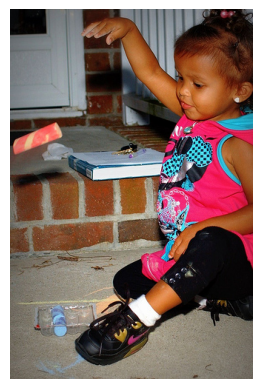

1/1 [==============================] - 0s 30ms/step
boy startseq red shirt is playing with guitar


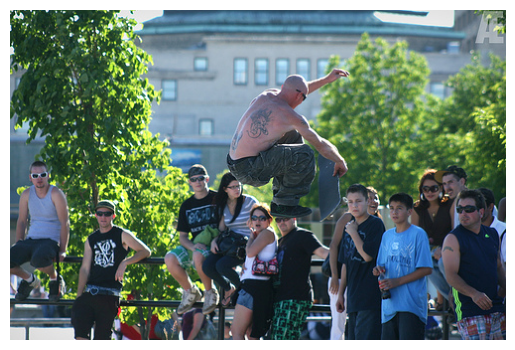

1/1 [==============================] - 0s 16ms/step
two children are playing on


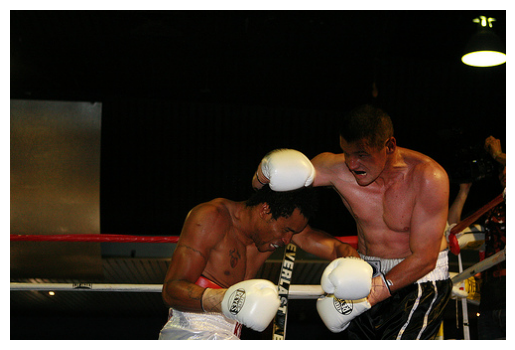

1/1 [==============================] - 0s 62ms/step
baseball player startseq white uniform is being tackled by crowd


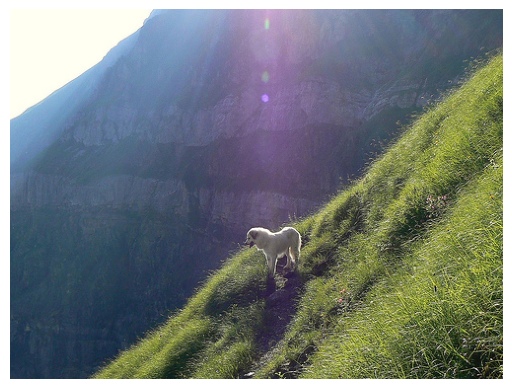

1/1 [==============================] - 0s 16ms/step
man is standing on top of mountain


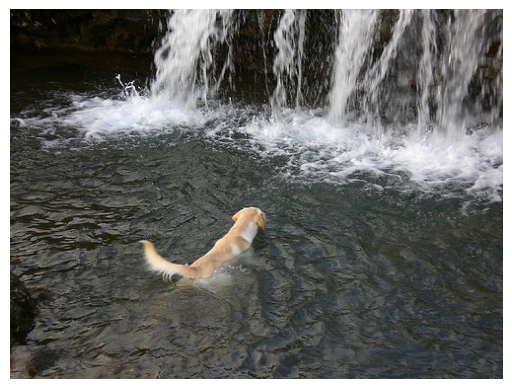

1/1 [==============================] - 0s 16ms/step
white dog is jumping into


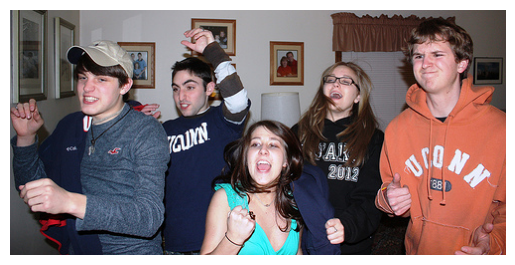

1/1 [==============================] - 0s 10ms/step
group of people pose for picture


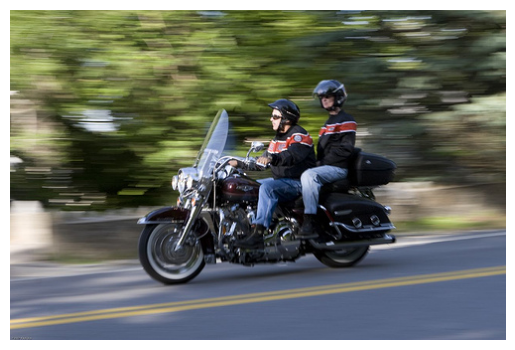

1/1 [==============================] - 0s 62ms/step
man turning dirt turn of dirt track


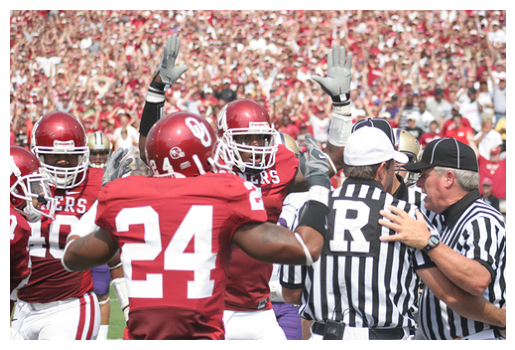

1/1 [==============================] - 0s 20ms/step
two football teams are fighting for


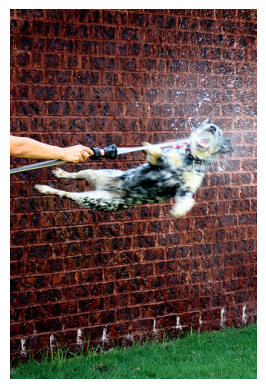

1/1 [==============================] - 0s 35ms/step
dog jumping into


In [6]:
for i in range(20):
    rn =  np.random.randint(0, 1000)
    img_name = list(encoding_test.keys())[rn]
    photo = encoding_test[img_name].reshape((1,2048))

    i = plt.imread(images+img_name)
    plt.imshow(i)
    plt.axis("off")
    plt.show()

    caption = predict_caption(photo)
    print(caption)

1/1 [==============================] - 0s 203ms/step


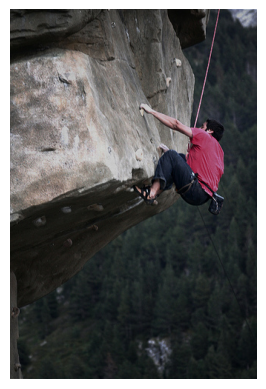

1/1 [==============================] - 0s 15ms/step
Predicted Caption: man startseq red shirt is climbing rock face


In [27]:
import numpy as np
import matplotlib.pyplot as plt

# Load the custom image
custom_image_path = "C:/Users/PRANEETH/Downloads/Flickr8k_Dataset/Flicker8k_Dataset/997722733_0cb5439472.jpg"
photo = encode_image(custom_image_path).reshape((1, 2048))

# Display the custom image
custom_image = plt.imread(custom_image_path)
plt.imshow(custom_image)
plt.axis("off")
plt.show()

# Predict the caption for the custom image
caption = predict_caption(photo)
print("Predicted Caption:", caption)


In [28]:
new_caption =re.sub(r'\s*startseq\s*', ' ', caption).strip()
new_caption

'man red shirt is climbing rock face'

In [15]:
pip install gtts


  Obtaining dependency information for gtts from https://files.pythonhosted.org/packages/a7/ef/190f64a4edeb13165e3c598a08f06a2ae80cdae0aa208c96c20efdb7ad4b/gTTS-2.4.0-py3-none-any.whl.metadata



[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: C:\Users\PRANEETH\AppData\Local\Programs\Python\Python311\python.exe -m pip install --upgrade pip


In [29]:
from gtts import gTTS
import os

# Create a gTTS object
tts = gTTS(new_caption)

# Save the speech to an audio file (e.g., mp3)
tts.save("C:/Users/PRANEETH/project phase/output.mp3")